In [1]:
import os
import pandas as pd
import numpy as np
import time 
import pwd
import re
import io
import nltk
import seaborn as sns
import ipywidgets as widgets
from ipywidgets import FileUpload
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from scipy import stats
from scipy.stats import shapiro
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import sys
import string
import math
import plotly.graph_objects as go
import plotly.express as px
import warnings
import boto3
import s3fs
import math
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Markdown, display
from ipywidgets import TwoByTwoLayout
from ipywidgets import interact, interactive, fixed, interact_manual
from ipywidgets import VBox, HBox, Label, Box
from ipywidgets import Button, Layout
from scipy import stats
import pandas as pd
from sklearn import preprocessing
sns.set()
def printmd(string):
    display(Markdown(string))

# Data collection

## Using written path

In [2]:
file_name = "OA2_PM25_2013.csv"
file_path =  "../Downloaded_Files/London_Test/PM2.5 map and exposure data/" + file_name
data = pd.read_csv(file_path)
data.head()

,OA11CD,LAD11NM,PM252013me
0,E00024024,Westminster,17.953073
1,E00023833,Westminster,18.183844
2,E00023830,Westminster,18.732058
3,E00023831,Westminster,17.909357
4,E00024021,Westminster,17.185809


## Using the file explorer

In [4]:
upload = FileUpload(accept='.csv')
upload

FileUpload(value={}, accept='.csv', description='Upload')

In [19]:
try:
    uploaded_filename = next(iter(upload.value))
    content = upload.value[uploaded_filename]['content']
    data = pd.read_csv(io.BytesIO(content), header=0, escapechar='\\', encoding= 'unicode_escape')
except StopIteration:
    printmd("## Please enter a valid file.**")

# Print the first rows in the data

In [20]:
data.head()

,OA11CD,LAD11NM,PM252013me
0,E00024024,Westminster,17.953073
1,E00023833,Westminster,18.183844
2,E00023830,Westminster,18.732058
3,E00023831,Westminster,17.909357
4,E00024021,Westminster,17.185809


# Data quality

Check for any missing values/outliers/distribution

In [8]:
missing_values = pd.DataFrame()
missing_data = data.apply(lambda x: sum(x.isnull()), axis=0).sort_values(ascending=False)
missing_values['missing_values_count'] = missing_data.values
missing_values['feature_name'] = missing_data.index
missing_values = missing_values[missing_values['missing_values_count'] != 0]

## Get the attributes with missing values and the count

In [9]:
if missing_values.empty == True:
    print("There are no missing values in the data.")
else:
    printmd("## The missing values:")
    print(missing_values)

## The missing values:

    missing_values_count             feature_name
0                   3236                Longitude
1                   3236                Easting_m
2                   3236                 Latitude
3                   3236               Northing_m
4                     44           PumpHoursTotal
5                     44  IncidentNotionalCost(£)
6                     43                PumpCount
7                      7                     Ward
8                      7                 WardCode
9                      6              BoroughCode
10                     6                  Borough
11                     5         FinalDescription


### Get indexes of missing values in the columns

In [10]:
missing_val = pd.Series()
for column in data.columns:
    missing_val[column] = np.where(data[column].isnull())

### Delete columns with no missing values

In [11]:
missing_val_indexes = missing_val.drop(missing_val.index[[index for index, value in enumerate(missing_val) if value[0].size == 0]])
printmd("## The columns with the indexes for missing values: ")
print(missing_val_indexes)

## The columns with the indexes for missing values: 

PumpCount                  ([314, 355, 523, 1268, 1394, 1415, 1557, 1761,...
PumpHoursTotal             ([314, 355, 523, 1268, 1394, 1415, 1557, 1761,...
IncidentNotionalCost(£)    ([314, 355, 523, 1268, 1394, 1415, 1557, 1761,...
FinalDescription                            ([662, 3027, 5489, 5708, 6427],)
WardCode                       ([2304, 4137, 4164, 4245, 4708, 5896, 6338],)
Ward                           ([2304, 4137, 4164, 4245, 4708, 5896, 6338],)
BoroughCode                          ([4137, 4164, 4245, 4708, 5896, 6338],)
Borough                              ([4137, 4164, 4245, 4708, 5896, 6338],)
Easting_m                  ([0, 4, 5, 8, 21, 28, 30, 34, 36, 39, 40, 41, ...
Northing_m                 ([0, 4, 5, 8, 21, 28, 30, 34, 36, 39, 40, 41, ...
Latitude                   ([0, 4, 5, 8, 21, 28, 30, 34, 36, 39, 40, 41, ...
Longitude                  ([0, 4, 5, 8, 21, 28, 30, 34, 36, 39, 40, 41, ...
dtype: object


## Get average missing values per row

In [12]:
average_missing_val = missing_values['missing_values_count'].sum() / data.shape[0]
printmd("### Average missing values per row: " + str(average_missing_val))

### Average missing values per row: 2.0265965671872586

## Percentage of similarity between attributes with missing values

In [13]:
def get_cosine_similarity(req_arr1, req_arr2):
    req_arr1 = req_arr1[0]
    req_arr2 = req_arr2[0]
    if len(req_arr2) > len(req_arr1):
        req_arr1 = list(map(lambda x: 0 if x not in req_arr1 else x, req_arr2))
    elif len(req_arr1) > len(req_arr2):
        req_arr2 = list(map(lambda x: 0 if x not in req_arr2 else x, req_arr1))
    dot_product = sum(x * y for (x, y) in zip(req_arr1, req_arr2))
    magnitude_arr1 = math.sqrt(sum(pow(x, 2) for x in req_arr1))
    magnitude_arr2 = math.sqrt(sum(pow(x, 2) for x in req_arr2))
    if magnitude_arr1 == 0 or magnitude_arr2 == 0:
        return 0.0
    else:
        return (dot_product / (magnitude_arr1 * magnitude_arr2))

In [14]:
df_na = pd.DataFrame(columns = missing_val_indexes.index, index =  missing_val_indexes.index)
for current_index_row in range(len(missing_val_indexes)):
    for current_index_column in range(len(missing_val_indexes)):
        df_na.iloc[current_index_row][current_index_column] = float(get_cosine_similarity(missing_val_indexes[current_index_row], missing_val_indexes[current_index_column]))
        
for column in df_na.columns:
    df_na[column] = df_na[column].astype('float')

printmd("## Similarity matrix between each column: ")    
display(df_na)

## Similarity matrix between each column: 

,PumpCount,PumpHoursTotal,IncidentNotionalCost(£),FinalDescription,WardCode,Ward,BoroughCode,Borough,Easting_m,Northing_m,Latitude,Longitude
PumpCount,1.000000,0.975112,0.975112,0.0,0.000000,0.000000,0.000000,0.000000,0.063434,0.063434,0.063434,0.063434
PumpHoursTotal,0.975112,1.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.069472,0.069472,0.069472,0.069472
IncidentNotionalCost(£),0.975112,1.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.069472,0.069472,0.069472,0.069472
FinalDescription,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WardCode,0.000000,0.000000,0.000000,0.0,1.000000,1.000000,0.982713,0.982713,0.000000,0.000000,0.000000,0.000000
Ward,0.000000,0.000000,0.000000,0.0,1.000000,1.000000,0.982713,0.982713,0.000000,0.000000,0.000000,0.000000
BoroughCode,0.000000,0.000000,0.000000,0.0,0.982713,0.982713,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
Borough,0.000000,0.000000,0.000000,0.0,0.982713,0.982713,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
Easting_m,0.063434,0.069472,0.069472,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
Northing_m,0.063434,0.069472,0.069472,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000


## Heatmap for similarity between missing values indexes

## Heatmap for similarity: 

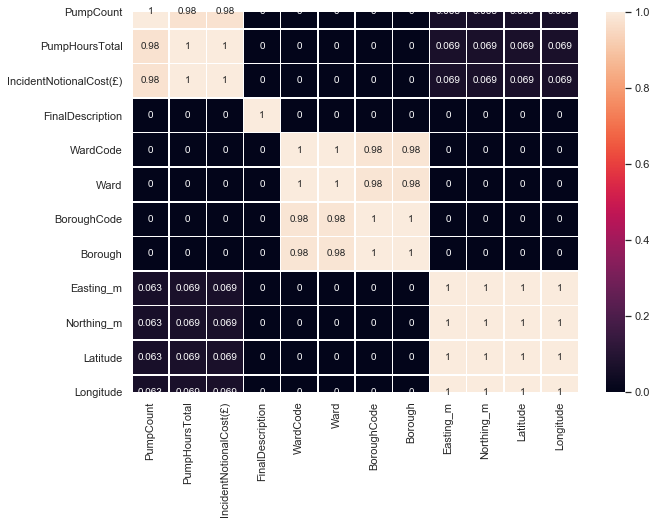

In [15]:
f, ax = plt.subplots(figsize=(10, 7))
try:
    printmd("## Heatmap for similarity: ")
    sns.heatmap(df_na, annot=True, annot_kws={"size": 10}, linewidths=.5)
except ValueError:
    pass

## Unique values for each column

In [16]:
df_features = pd.DataFrame(index = data.columns)
df_features['Total_Values'] = list(map(lambda x: data[x].count(), data.columns))
df_features['Unique_Values'] = list(map(lambda x: data[x].value_counts().count(), data.columns))
df_features['Most_Frequent_Value'] = list(map(lambda x: data[x].value_counts().sort_values(ascending = False).index[0], data.columns))
df_features['Most_Frequent_Value_Count'] = list(map(lambda x: data[x].value_counts().sort_values(ascending = False).iloc[0], data.columns))
df_features['Type_Data'] = list(map(lambda x: data[x].dtype, data.columns))

In [17]:
printmd("## Unique values for each column: ")
df_features

## Unique values for each column: 

,Total_Values,Unique_Values,Most_Frequent_Value,Most_Frequent_Value_Count,Type_Data
IncidentNumber,6467,6467,084277-03072016,1,object
DateTimeOfCall,6467,6456,22/04/2011 14:50,2,object
CalYear,6467,11,2011,620,int64
FinYear,6467,12,2011/12,650,object
TypeOfIncident,6467,1,Special Service,6467,object
PumpCount,6424,4,1,6297,float64
PumpHoursTotal,6423,12,1,5666,float64
HourlyNotionalCost(£),6467,9,260,2391,int64
IncidentNotionalCost(£),6423,60,260,2095,float64
FinalDescription,6462,4640,SMALL ANIMAL RESCUE,141,object


## Get all the unique values for a column

In [18]:
def get_unique_values(req_data, req_column):
    return pd.Series(req_data[req_column].value_counts().index)

printmd("## Unique values for a specific column: ")
get_unique_values(data, 'Ward')

## Unique values for a specific column: 

0                   LEA BRIDGE
1                  St. Peter's
2                     Woodside
3                   Lea Bridge
4                Old Kent Road
                 ...          
1203                     Manor
1204    Stratford and New Town
1205             GOLDERS GREEN
1206                 CROOK LOG
1207                   LOXFORD
Length: 1208, dtype: object

# Get outliers for the data

## Select the column to get the outliers

Can only select numerical columns.

In [21]:
def filter_column(req_column):
    return data[req_column].dtype == 'float64' or data[req_column].dtype == 'int16'
def get_columns(req_data):
    result = []
    for col in filter(filter_column, req_data.columns):
        result.append(col)
    return result

widget_column = widgets.SelectMultiple(
    options = get_columns(data),
    rows = 10,
    description = 'Columns:',
    disabled = False,
    layout=Layout(width='95%', height='100%')
)

columns_arr = list()
def column(x):
    columns_arr.append(x)
    
w1_1= interactive(column,  x=widget_column)
HBox([w1_1])

## Boxplot for the value

In [22]:
try:
    if columns_arr[len(columns_arr) - 1][0] != "":
        plt.figure(figsize=(20,5))
        column_name = columns_arr[len(columns_arr) - 1][0]
        fig = go.Figure()
        fig.add_trace(go.Box(x=data[column_name]))
        fig.update_layout(yaxis_title=column_name)
        fig.update_layout(xaxis_title="Values")
        fig.show()
except KeyError:
    printmd("## Please select a column.")
except IndexError:
    printmd("## Please select a column.")

<Figure size 1440x360 with 0 Axes>

## Get the scatter plot columns

In [23]:
widget_column = widgets.SelectMultiple(
    options = data.columns,
    rows = 10,
    description = 'Columns:',
    disabled = False,
    layout=Layout(width='90%', height='100%')
)

columns_arr_2 = list()
def column_2(x):
    columns_arr_2.append(x)
    
w1_2= interactive(column_2,  x=widget_column)
HBox([w1_2])

## Scatter plot of the values

In [24]:
try:
    if columns_arr_2[len(columns_arr_2) - 1][0] != "":
        #fig, ax = plt.subplots(figsize=(20,16))
        column_names = columns_arr_2[len(columns_arr_2) - 1]
        #ax.scatter(data[column_names[1]], data[column_names[0]])
        #ax.set_xlabel(column_names[1])
        #ax.set_ylabel(column_names[0])
        #plt.show()
        fig = px.scatter(data, x=column_names[1], y=column_names[0], hover_data=[column_names[0]], width=970, height=1000)
        fig.show()
except KeyError:
    printmd("## Please select valid columns.")
except IndexError:
    printmd("## Please select a column.")

## Distribution plot of the values

In [25]:
try:
    if columns_arr[len(columns_arr) - 1][0] != "":
        plt.figure(figsize=(20,5))
        column_name = columns_arr[len(columns_arr) - 1][0]
        fig = px.histogram(data, x="PM252013me",
                   marginal="box", # or violin, rug
                   hover_data=data.columns)
        fig.show()
except KeyError:
    printmd("## Please select a column.")
except IndexError:
    printmd("## Please select a column.")

<Figure size 1440x360 with 0 Axes>

## Get the Z-Score

Z-Score is used in order to find the outliers in a dataset. Plot the normal distribution using Z-Score.


In [26]:
try:
    if columns_arr[len(columns_arr) - 1][0] != "":
        plt.figure(figsize=(20,5))
        column_name = columns_arr[len(columns_arr) - 1][0]
        z = pd.DataFrame()
        z['Z-Score'] = np.abs(stats.zscore(data[column_name]))
        fig = px.histogram(z, x='Z-Score', marginal="box")
        fig.show()
except KeyError:
    printmd("## Please select a column.")
except IndexError:
    printmd("## Please select a column.")

<Figure size 1440x360 with 0 Axes>

## Get the indices of outliers and display the values

In [27]:
z = np.abs(stats.zscore(data[column_name]))
indexes = np.where(z > 2.5)[0]
display(data.loc[indexes])

,OA11CD,LAD11NM,PM252013me
1,E00023833,Westminster,18.183844
2,E00023830,Westminster,18.732058
7,E00023884,Westminster,19.014768
11,E00024030,Westminster,18.087072
16,E00175182,Westminster,18.895378
...,...,...,...
21766,E00004185,Camden,19.926431
21769,E00004182,Camden,18.199491
21771,E00004189,Camden,18.934682
22805,E00002904,Brent,18.670287


## Count the number of outliers

In [ ]:
printmd("## We have " + str(len(indexes)) + " outliers for the column: " + column_name + ".")